# Align Experiment and Colloidal Ice object

In this script, I will align the first experimental video with a Cairo lattice.

In [1]:
import os
import glob
import sys
import copy as cp

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pims as pm
from pims import pipeline

sys.path.insert(0, '../icenumerics')
import icenumerics as ice
ureg = ice.ureg
import transformations as tr

sys.path.insert(0, '../Scripts/')
import support as sup
from importlib import reload  
reload(sup)

os.environ["IMAGEIO_FFMPEG_EXE"] = "/usr/bin/ffmpeg"

%load_ext autoreload
%autoreload 2

In [2]:
directory =  "/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022"

In [3]:
filenames = [file for file in glob.glob(
    os.path.join(directory,('*.AVI')))]

filenames = [f for f in filenames]
filenames

['/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_600s_h2_w2_exp29_2022_05_19_17_15_09.AVI',
 '/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_600s_h2_w2_exp9_2022_05_17_16_10_46_rename.AVI',
 '/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_600s_h2_w2_exp20_2022_05_18_16_50_03_rename.AVI',
 '/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_600s_h2_w2_exp16_2022_05_18_12_36_36_rename.AVI',
 '/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_600s_h2_w2_exp27_2022_05_19_15_39_48.AVI',
 '/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_600s_h2_w2_exp26_2022_05_19_15_08_16.AVI',
 '/media/Carol/Magnetic/Experiments/Colloidal_Ice/Cairo_lattice/PreAnalysis_17-05-2022/Cairo_6x6-0V-4V_6

## Collection of functions used to align 

In [5]:
def particle_locations_to_colloids(entry):
    
    nx = 5
    ny = 5
    a = 19.5458*ureg.um
    
    particle = ice.particle(radius = 10*ureg.um)

    trap_long = ice.trap(trap_sep = 20*ureg.um,
                   height = 30*ureg.pN*ureg.nm,
                   stiffness = 0.1*ureg.fN/ureg.nm)

    trap_short = ice.trap(trap_sep = 4.5258*ureg.um,
                   height = 30*ureg.pN*ureg.nm,
                  stiffness = 0.1*ureg.fN/ureg.nm)
    
    
    traps = []

    sp_cairo = sup.spins()
    v = ice.vertices()
    
    display(entry)
    
    sp_cairo.create_lattice(geometry = "cairo",size =[nx,ny],lattice_constant=a, border="periodic")
    
    for s in sp_cairo:
    
        if ( s.direction[0].magnitude == a.magnitude or s.direction[0].magnitude == -a.magnitude or 
            s.direction[1].magnitude == a.magnitude or s.direction[1].magnitude == -a.magnitude ):
        
            traps.append(trap_short)
        
        else:
        
            traps.append(trap_long)
            
    

    sp_cairo = tr.rotate(sp_cairo,(entry[["angle"]].values[0])*ureg.deg)
    sp_cairo = tr.scale(sp_cairo,entry[["scale"]].values*np.array([1,1]))
    sp_cairo = tr.translate(sp_cairo,entry[["x_offset","y_offset"]].values*ureg.um)
    
    col = ice.colloidal_ice(sp_cairo, particle, traps, height_spread = 0, susceptibility_spread = 0.1)
    
    return col

In [6]:
def strip_name(name,ext): 
    name = os.path.split(name)[-1]
    return name[:name.find(ext)]

### end collection of functions

In order to run de code we had to install pims and imageio-ffmpeg and add line:

    os.environ["IMAGEIO_FFMPEG_EXE"] = "/usr/bin/ffmpeg"

In [7]:
pd.DataFrame(data = [], columns = ["name","scale","x_offset", "y_offset", "angle"]).to_csv(os.path.join(directory,"parameters.dat"),sep="\t")
parameters = pd.read_csv(os.path.join(directory,"parameters.dat"),sep = "\t", index_col = [0])

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f304e664170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp31_2022_05_20_11...
scale                                                   3.425
x_offset                                                 -226
y_offset                                                 1203
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp31_2022_05_20_11_12_25.AV, dtype: object

(-100, 1020)

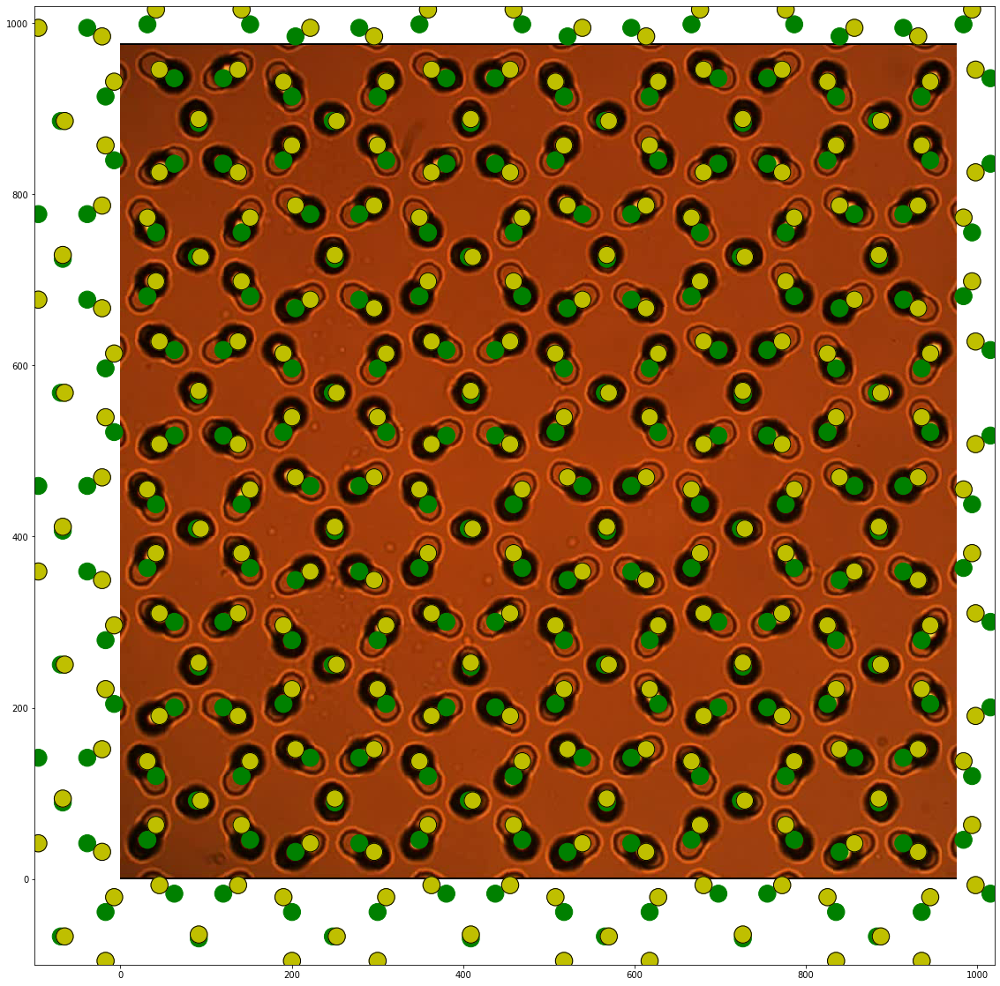

In [19]:
i = 16

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.425
parameters.loc[basename,"x_offset"] = -226
parameters.loc[basename,"y_offset"] = 1203
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Aligned!

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f304e664170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10...
scale                                                     3.4
x_offset                                                 -230
y_offset                                                 1190
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10_56_28.AV, dtype: object

(-100, 1020)

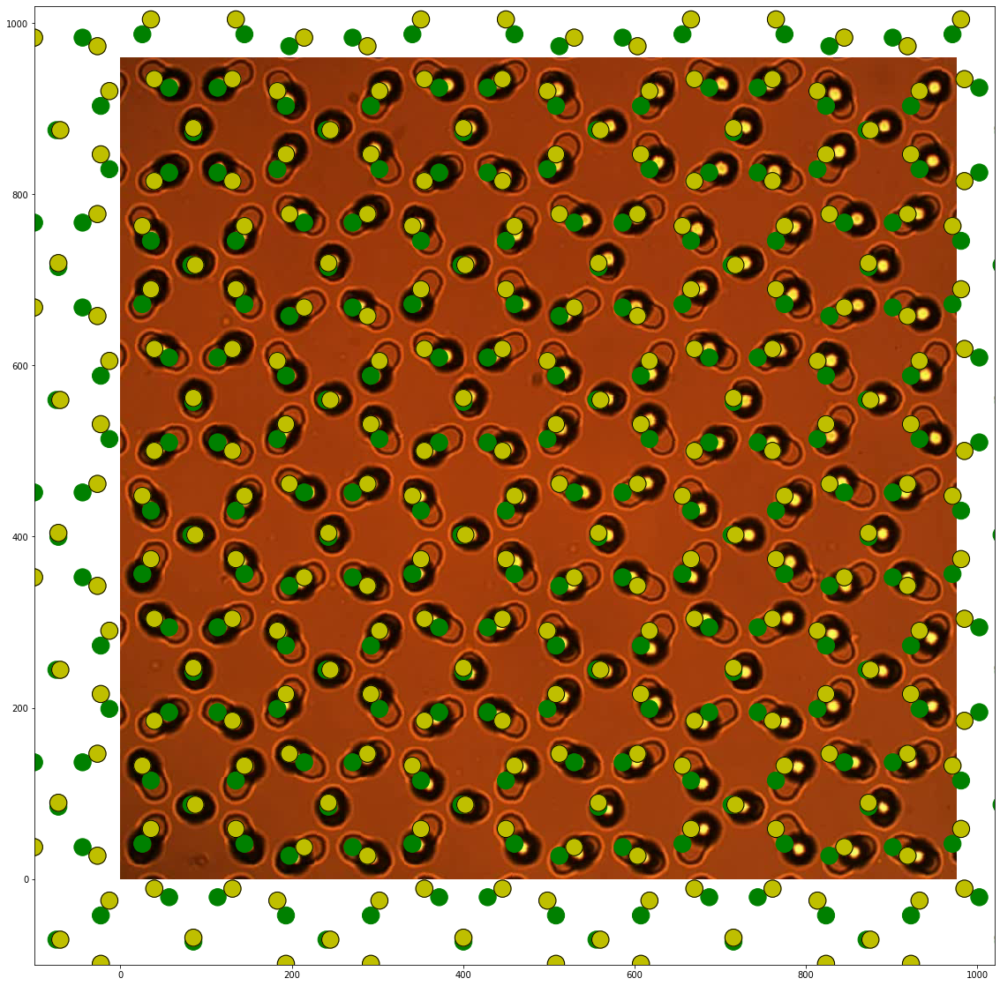

In [9]:
i = 17


fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.4
parameters.loc[basename,"x_offset"] = -230
parameters.loc[basename,"y_offset"] = 1190
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f304e664170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10...
scale                                                     3.4
x_offset                                                 -229
y_offset                                                 1188
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10_56_28.AV, dtype: object

(-100, 1020)

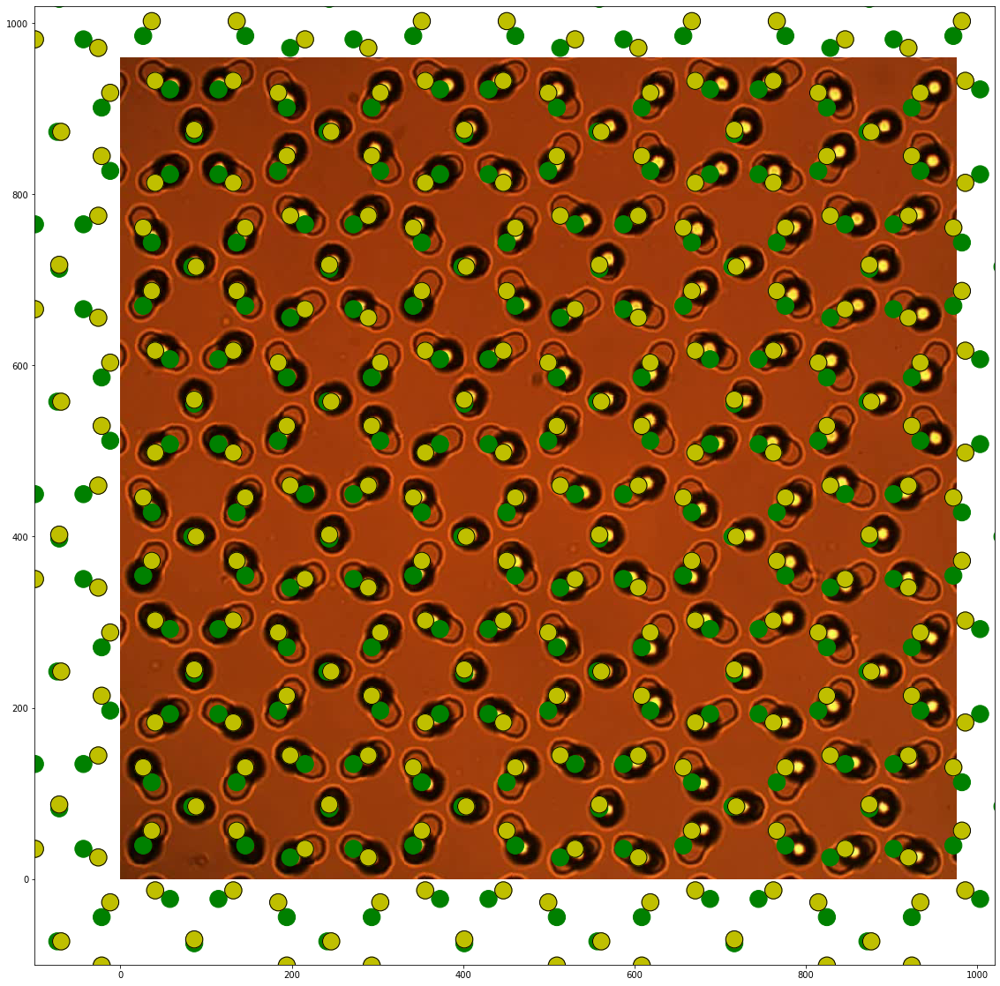

In [10]:
i = 17

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.40
parameters.loc[basename,"x_offset"] = -229
parameters.loc[basename,"y_offset"] = 1188
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f304e664170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10...
scale                                                   3.415
x_offset                                                 -232
y_offset                                                 1192
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10_56_28.AV, dtype: object

(-100, 1020)

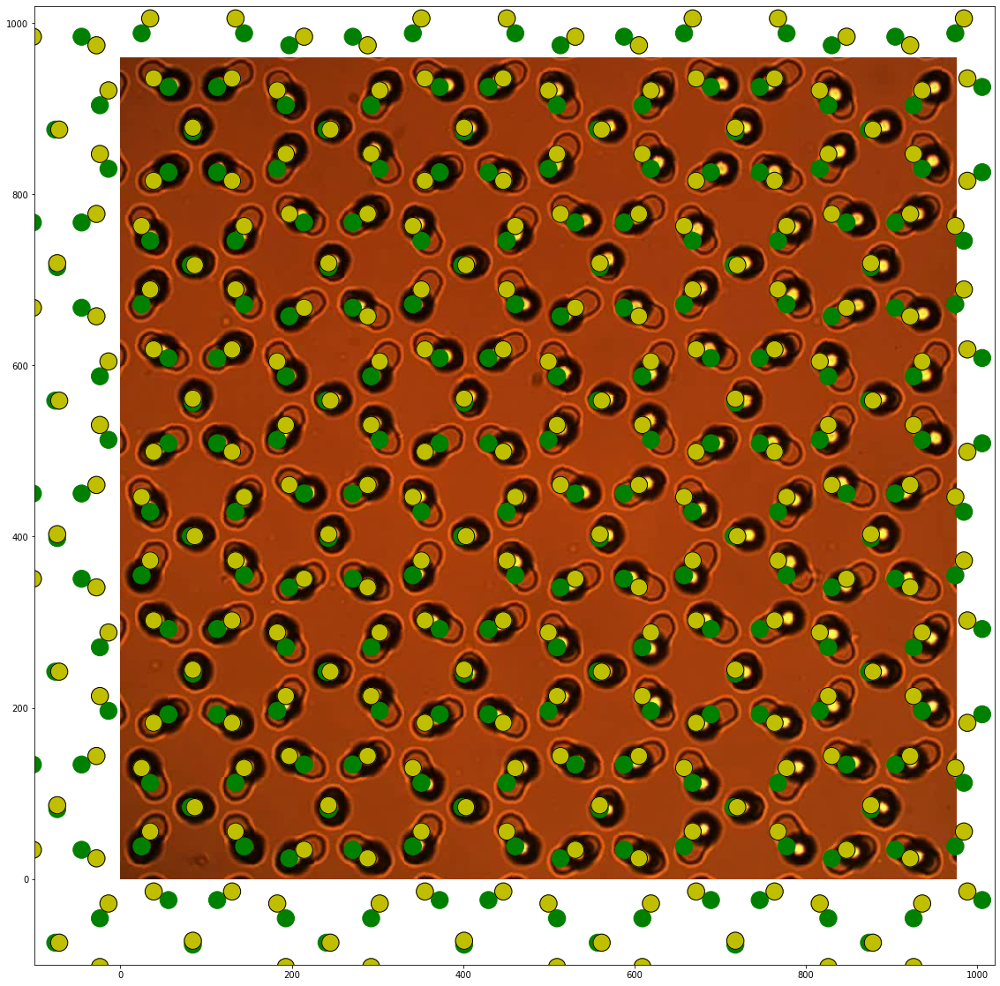

In [11]:
i = 17

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.415
parameters.loc[basename,"x_offset"] = -232
parameters.loc[basename,"y_offset"] = 1192
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f304e664170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10...
scale                                                   3.425
x_offset                                                 -224
y_offset                                                 1196
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp30_2022_05_20_10_56_28.AV, dtype: object

(-100, 1020)

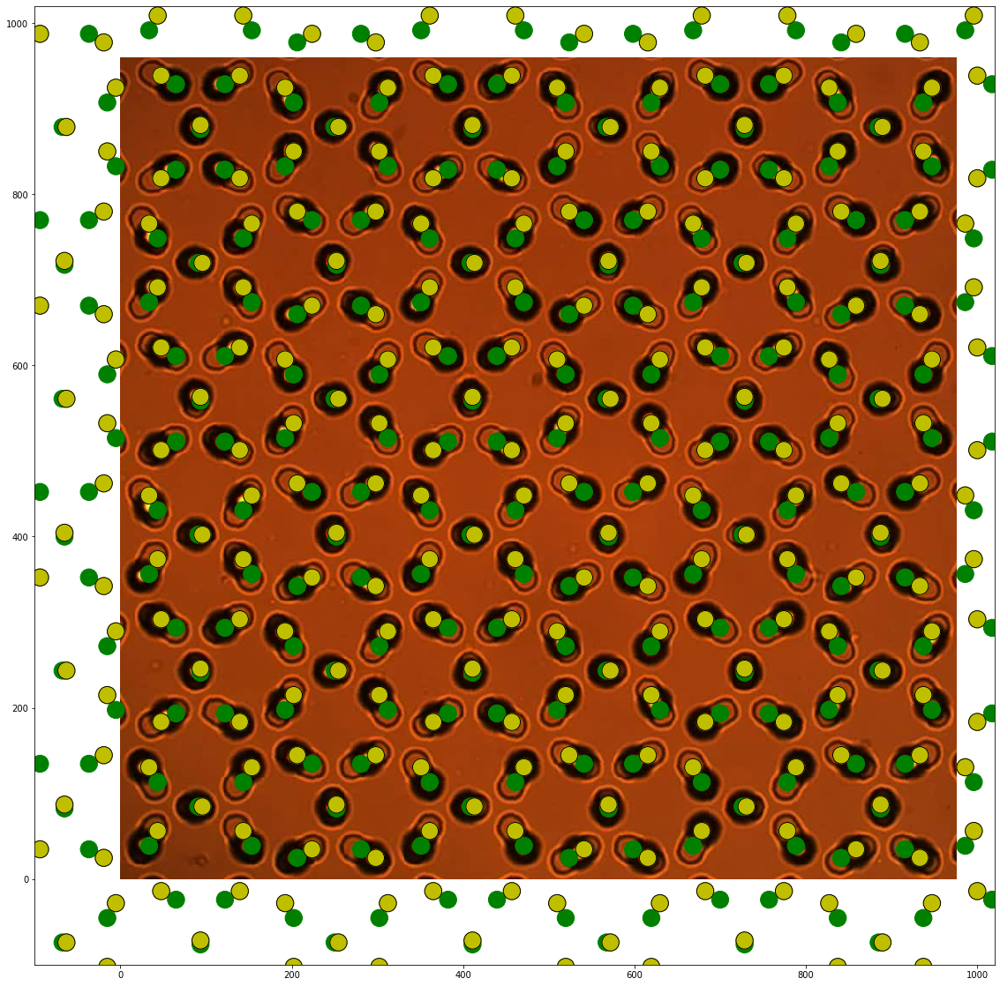

In [14]:
i = 17

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.425
parameters.loc[basename,"x_offset"] = -224
parameters.loc[basename,"y_offset"] = 1196
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f0a5f120170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp6_2022_05_17_15_...
scale                                                   3.415
x_offset                                                 -230
y_offset                                                 1193
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp6_2022_05_17_15_18_14_rename, dtype: object

(-100, 1020)

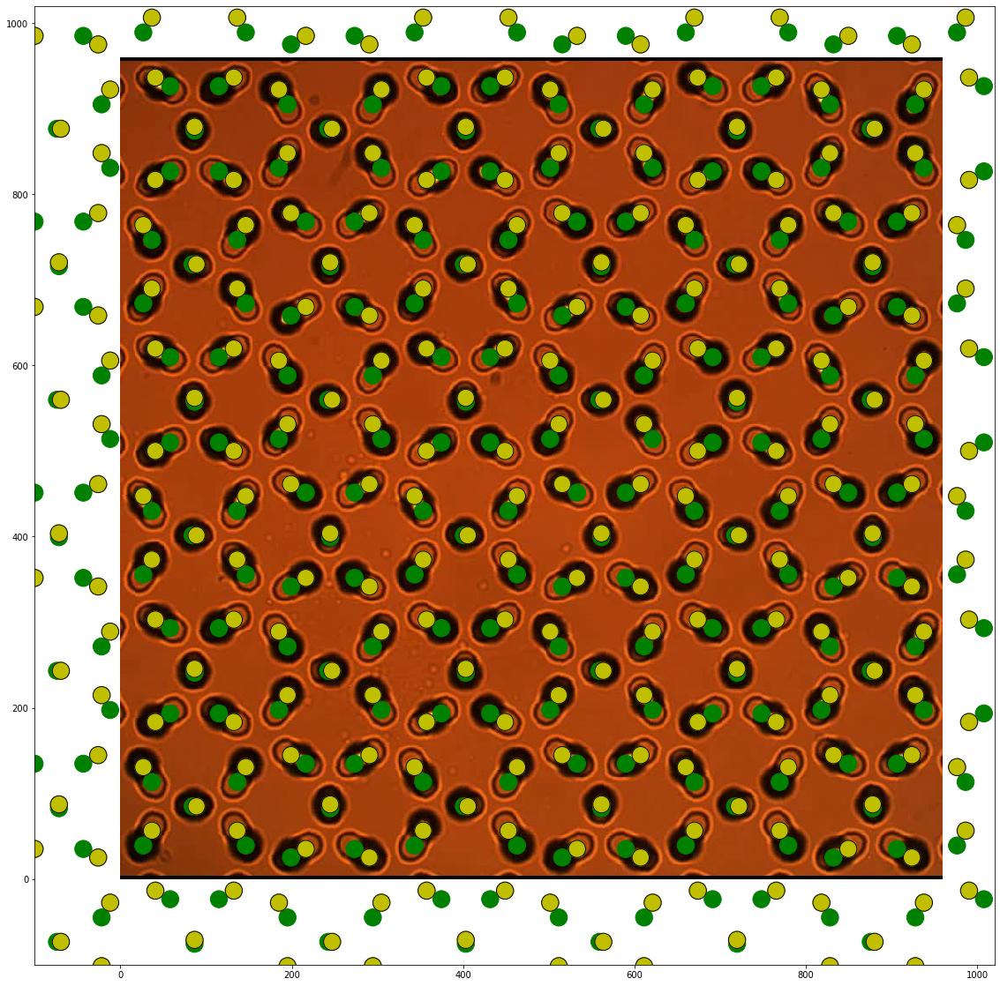

In [16]:
i = 4

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.415
parameters.loc[basename,"x_offset"] = -230
parameters.loc[basename,"y_offset"] = 1193
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f0a5f120170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp7_2022_05_17_15_...
scale                                                   3.416
x_offset                                                 -235
y_offset                                                 1193
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp7_2022_05_17_15_34_13_rename, dtype: object

(-100, 1020)

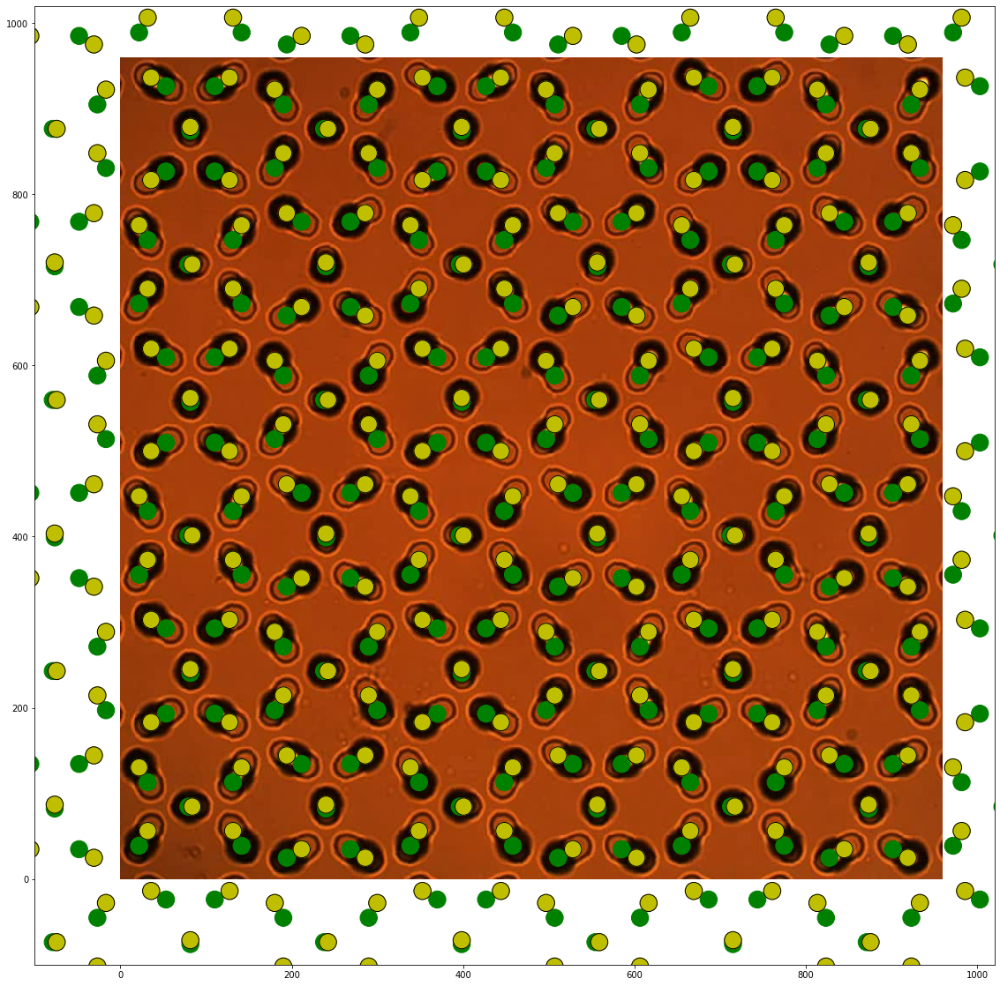

In [19]:
i = 5

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.416
parameters.loc[basename,"x_offset"] = -235
parameters.loc[basename,"y_offset"] = 1193
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')

Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7f0a5f120170>
Traceback (most recent call last):
  File "/home/carolina/anaconda3/lib/python3.7/site-packages/pims/pyav_reader.py", line 368, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


name        Cairo_6x6-0V-4V_600s_h2_w2_exp8_2022_05_17_15_...
scale                                                   3.416
x_offset                                                 -233
y_offset                                                 1199
angle                                                       0
Name: Cairo_6x6-0V-4V_600s_h2_w2_exp8_2022_05_17_15_53_22_rename, dtype: object

(-100, 1020)

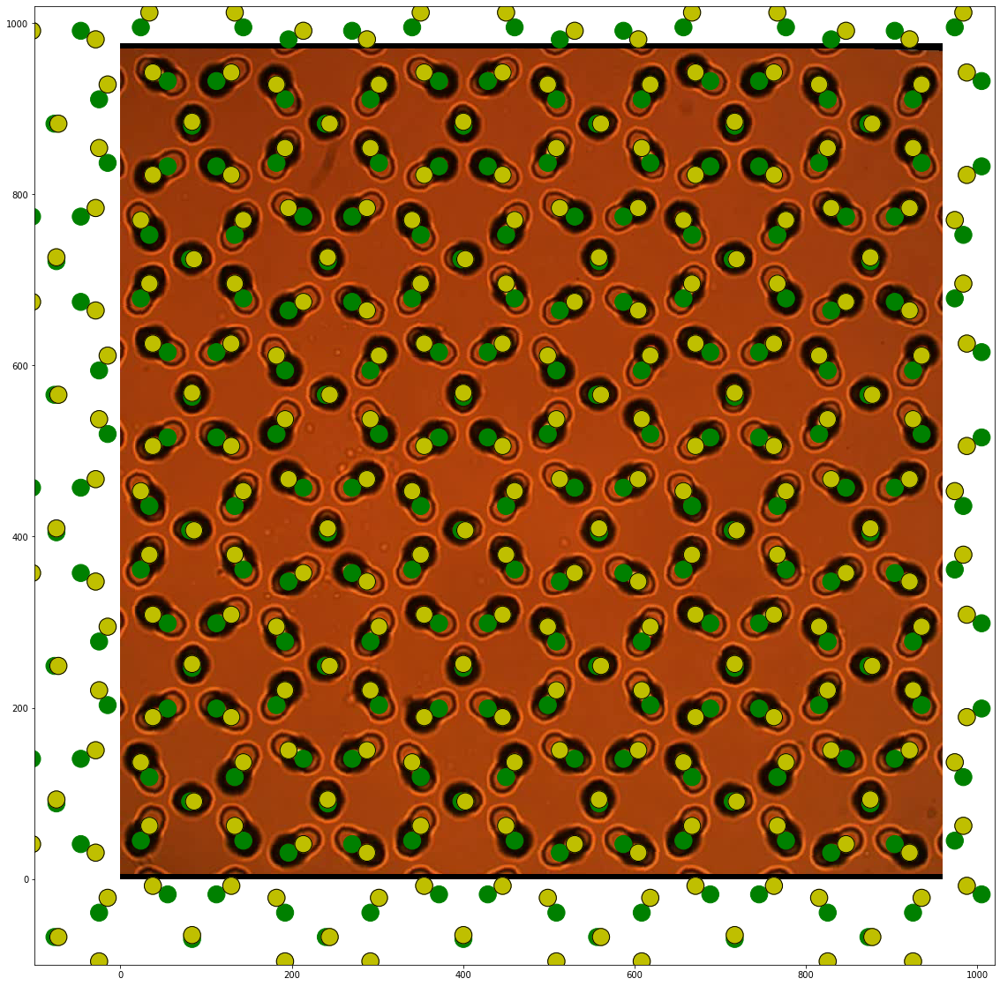

In [26]:
i = 6

fname = filenames[i]

basename = strip_name(fname,".avi")
parameters.loc[basename,"name"] = basename
parameters.loc[basename,"scale"] = 3.416
parameters.loc[basename,"x_offset"] = -233
parameters.loc[basename,"y_offset"] = 1199
parameters.loc[basename,"angle"] = 0

fig, ax = plt.subplots(1,1,figsize=(20,20))

video = pm.open(fname)
col = particle_locations_to_colloids(parameters.loc[basename])

ax.imshow(video[0])
#Çax.axis('off')
col.display(ax)
ax.set_xlim(-100, 1020)
ax.set_ylim(-100, 1020)
#plt.savefig('cairo.pdf')